# Régressions linéaires sur les données

In [4]:
import os
import re

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

from sklearn import linear_model
from sklearn.preprocessing import LabelEncoder

import seaborn as sns

In [5]:
cd ../../data

[Errno 2] No such file or directory: '../../data'
/Users/lise/memoire_tech/M2_HN/data


In [6]:
with open("textile_clean.csv") as csv :
    df_textile = pd.read_csv(csv, sep="\t")

# Relation entre les catégories

Transformation ordinale (passage de _string_ à des valeurs ordinales) pour pouvoir ensuite faire des représentations graphiques.

Source : https://machinelearningmastery.com/one-hot-encoding-for-categorical-data/

In [7]:
cat_suppr = ["ID", "description", "image", "direction of warp", "usage","thread 5","thread 6","thread 4", "size", "contrast"]
for elt in cat_suppr :
    df_textile = df_textile.drop(columns = elt)
colonnes = df_textile.columns.tolist()

In [8]:
#Récupération de la liste des catégories de métadonnées
print(colonnes, "\n")

def vocab (cat) :
    data_column = df_textile.loc[:, cat].to_list()
    vocab = list(set(data_column))
    return vocab

        
print(vocab('repository'))

['product', 'period', 'repository', 'production site', 'find site', 'style', 'motif', 'technique', 'structure', 'culture', 'composition', 'component', 'thread 1', 'material', 'type of torsion', 'colour of the thread strands', 'thickness', 'direction of torsion', 'torsion of thread', 'thread 2', 'thread 3', 'fabric', 'colour', 'number of colour layers', 'finish', 'motif attribute', 'scene', 'sequence', 'symmetry'] 

['Casa Nacional de Moneda Museum, website', 'National Archaeological Museum, website', 'Museum of Bolivian Andean textiles, website', 'Anthropological Museum, Universidad Real Mayor y Pontificia de San Francisco Xavier, Chuquisaca, website', 'Museum of Indigenous Art ASUR, website', 'Archaeological and Anthropological Museum of San Miguel de Azapa, website', 'British Museum, website', 'Victoria and Albert Museum, website', 'Aymara Language and Culture Institute, website', 'National Museum of Ethnography and Folklore, website', 'Museo Casa del Corregidor, website', 'Archaeolo

In [9]:
#Produire un dataframe dans lequel chaque valeur est encodée de manière unique
#Produire dictionnaire dans lequel on a les valeurs possible (nb_cat) et les noms associés (name_cat)

encoder = LabelEncoder()
    
df_encoded = pd.DataFrame()

dico = {}
    
colonnes = df_textile.columns.tolist()
for elt in colonnes : 
    encode = df_textile[[elt]].to_numpy().flatten()
    result = encoder.fit_transform(encode)
    
    nb_unique = list(dict.fromkeys(list(result)))
    name_unique = list(dict.fromkeys(list(encoder.inverse_transform(result))))
    
    dico[f'nb_{elt}']= nb_unique
    dico[f'name_{elt}']= name_unique
    
    df_encoded[elt] = pd.Series(result.tolist())
    
df_encoded

,product,period,repository,production site,find site,style,motif,technique,structure,culture,...,thread 2,thread 3,fabric,colour,number of colour layers,finish,motif attribute,scene,sequence,symmetry
0,100,7,9,19,26,7,144,69,11,7,...,1,1,19,49,0,110,49,4,27,5
1,92,7,9,26,32,10,401,94,27,47,...,2,2,19,150,0,110,76,4,27,19
2,13,7,9,26,32,10,122,85,27,47,...,2,2,19,232,0,55,76,4,27,19
3,92,7,9,19,26,7,137,69,11,7,...,2,2,19,46,0,110,46,4,27,6
4,20,7,9,54,48,19,181,99,27,50,...,1,1,19,54,0,55,9,4,27,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
691,28,4,12,87,71,55,295,76,11,28,...,1,1,19,174,0,110,76,4,5,19
692,87,4,12,86,71,50,312,87,26,40,...,2,2,19,191,0,104,40,4,27,19
693,11,4,12,87,71,55,430,129,33,28,...,1,1,21,12,0,4,76,4,25,19
694,71,1,12,103,87,51,476,13,33,37,...,0,1,3,309,0,100,35,4,14,19


### Rapport entre les variables

Repository / product 

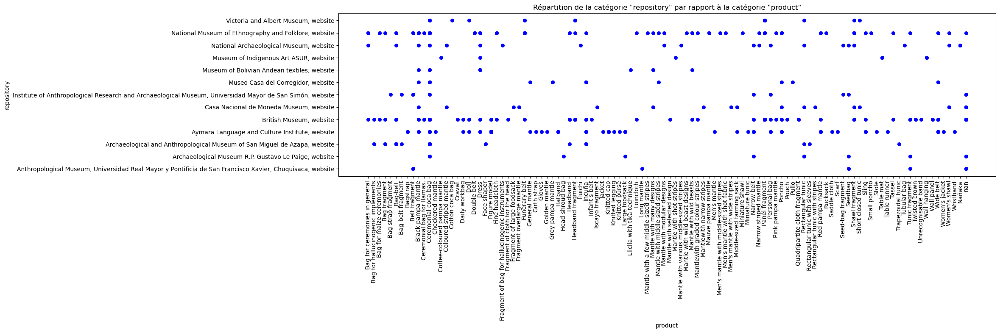

In [ ]:
cat1 = 'repository'
cat2 = 'product'

plt.figure(figsize=(20, 5))
plt.rcParams['figure.figsize'] = 40, 12

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Répartition de la catégorie "{cat1}" par rapport à la catégorie "{cat2}"')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

Repository / find site

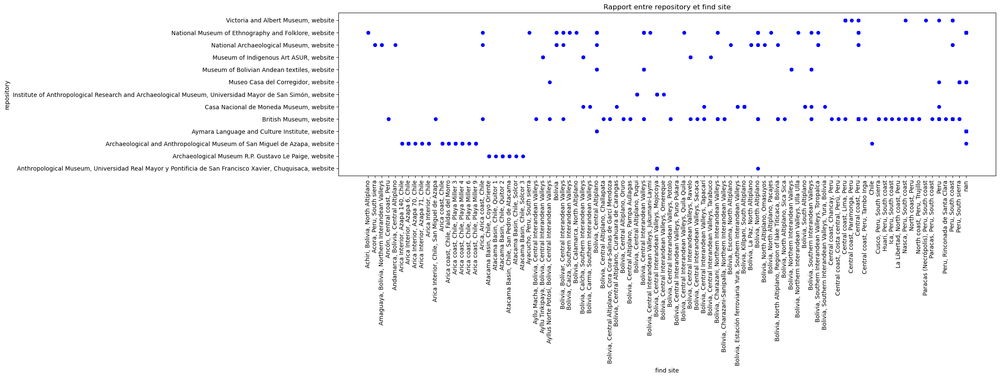

In [385]:
cat1 = 'repository'
cat2 = 'find site'

plt.figure(figsize=(20, 5))

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

Repository / production site

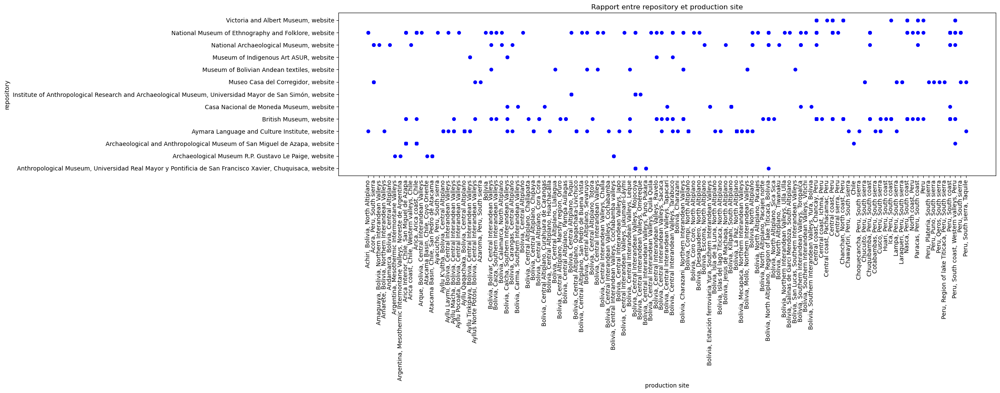

In [389]:
cat1 = 'repository'
cat2 = 'production site'

plt.figure(figsize=(20, 5))

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

Period / find site

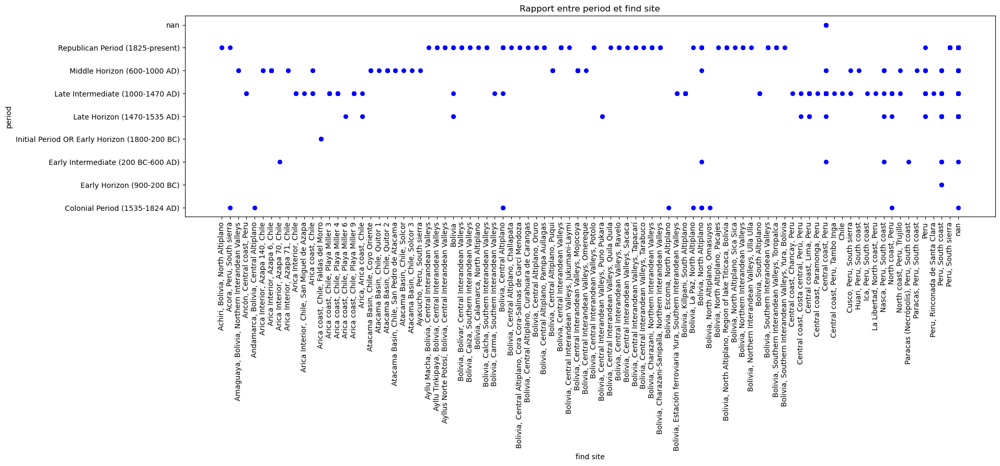

In [390]:
cat1 = 'period'
cat2 = 'find site'

plt.figure(figsize=(20, 5))

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

Period / production site

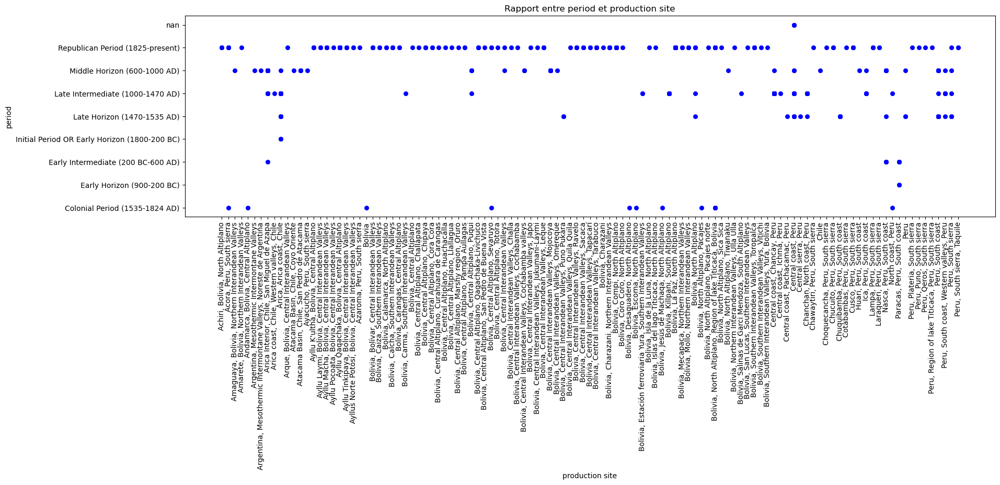

In [391]:
cat1 = 'period'
cat2 = 'production site'


plt.figure(figsize=(20, 5))

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

Style / Period

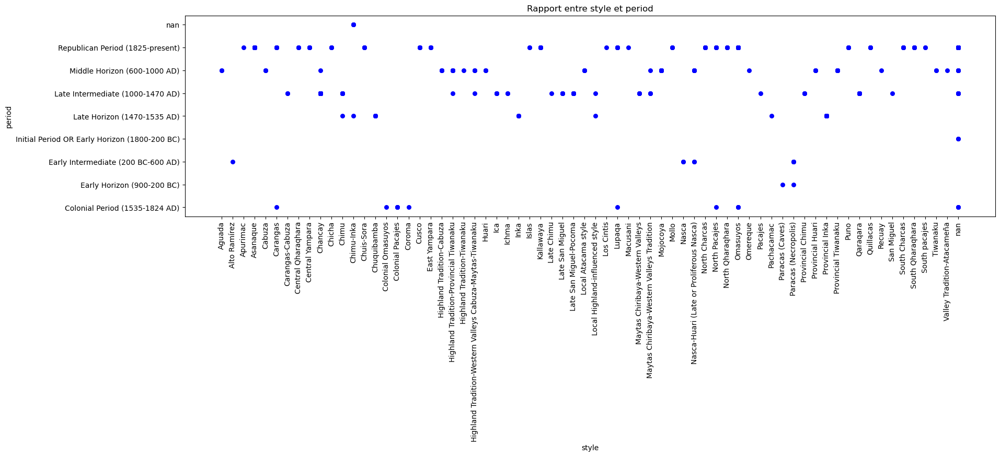

In [392]:
cat1 = 'style'
cat2 = 'period'

plt.figure(figsize=(20, 5))

X = df_encoded[f'{cat1}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat2}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat1}')
plt.xticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'],rotation='vertical')

plt.ylabel(f'{cat2}')
plt.yticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

Technique / production site

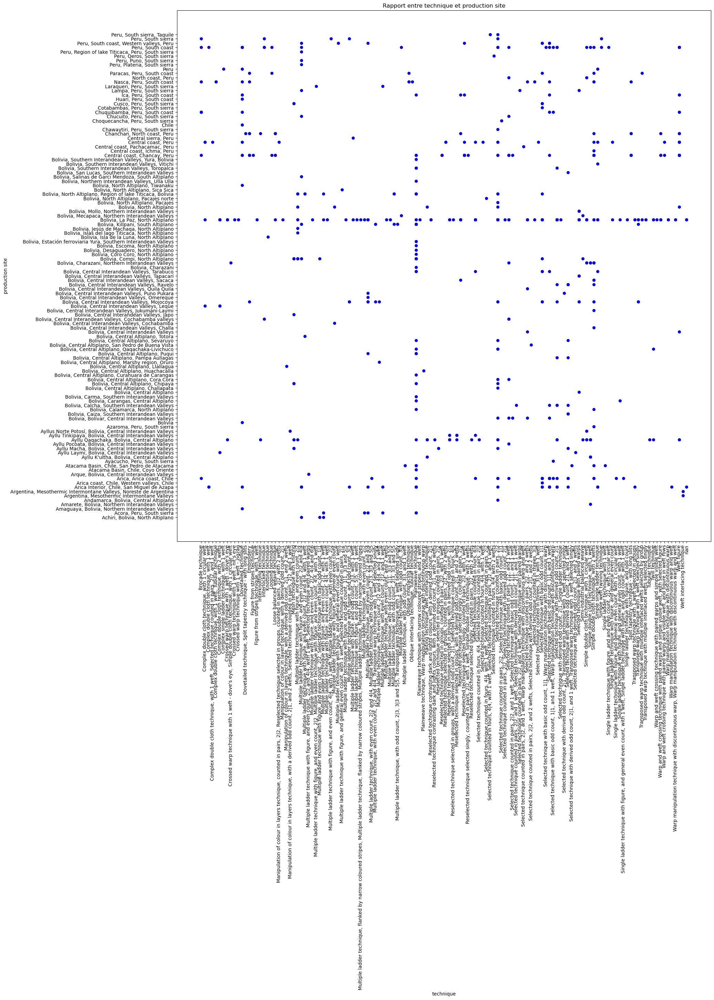

In [374]:
cat1 = 'technique'
cat2 = 'production site'

plt.figure(figsize=(20, 20))


X = df_encoded[f'{cat1}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat2}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat1}')
plt.xticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'],rotation='vertical')

plt.ylabel(f'{cat2}')
plt.yticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.show()

Technique / period

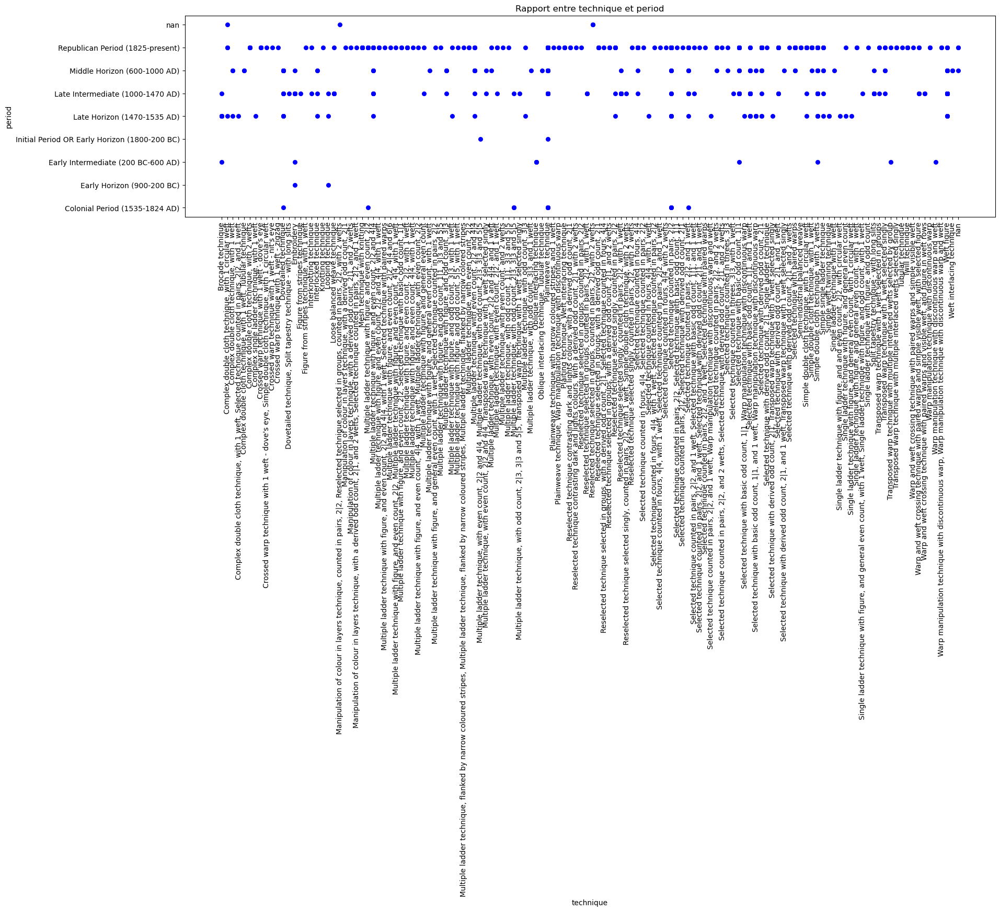

In [376]:
cat1 = 'technique'
cat2 = 'period'

plt.figure(figsize=(20, 5))

X = df_encoded[f'{cat1}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat2}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat1}')
plt.xticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'],rotation='vertical')

plt.ylabel(f'{cat2}')
plt.yticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.show()

Technique / motifs

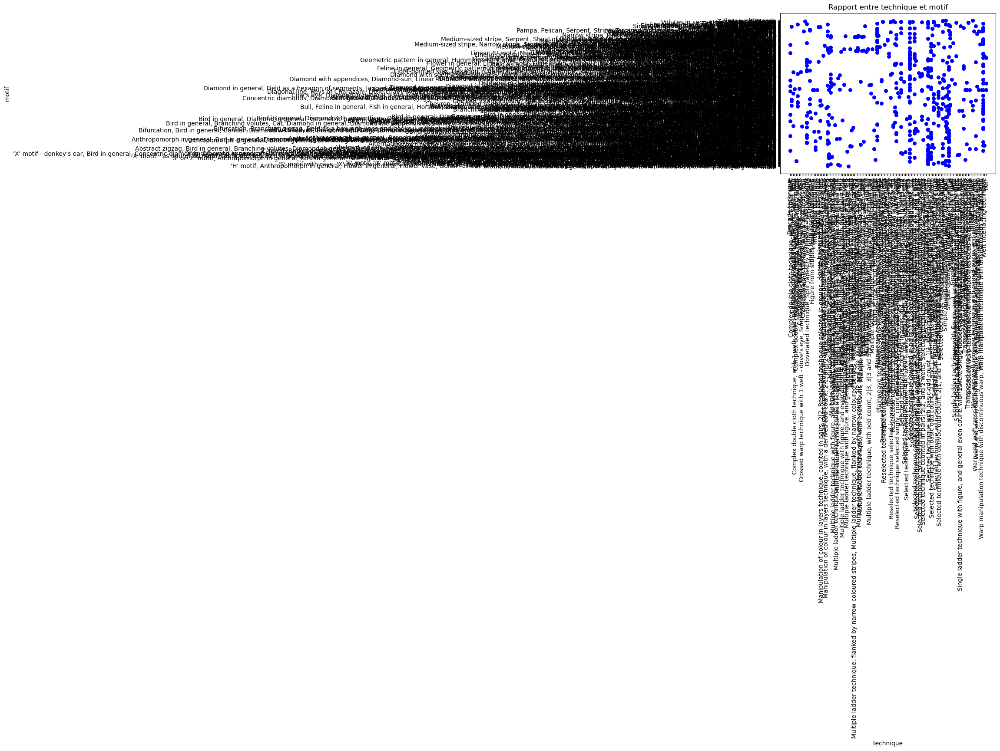

In [292]:
cat1 = 'technique'
cat2 = 'motif'

X = df_encoded[f'{cat1}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat2}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat1}')
plt.xticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'],rotation='vertical')

plt.ylabel(f'{cat2}')
plt.yticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.show()

Technique / product

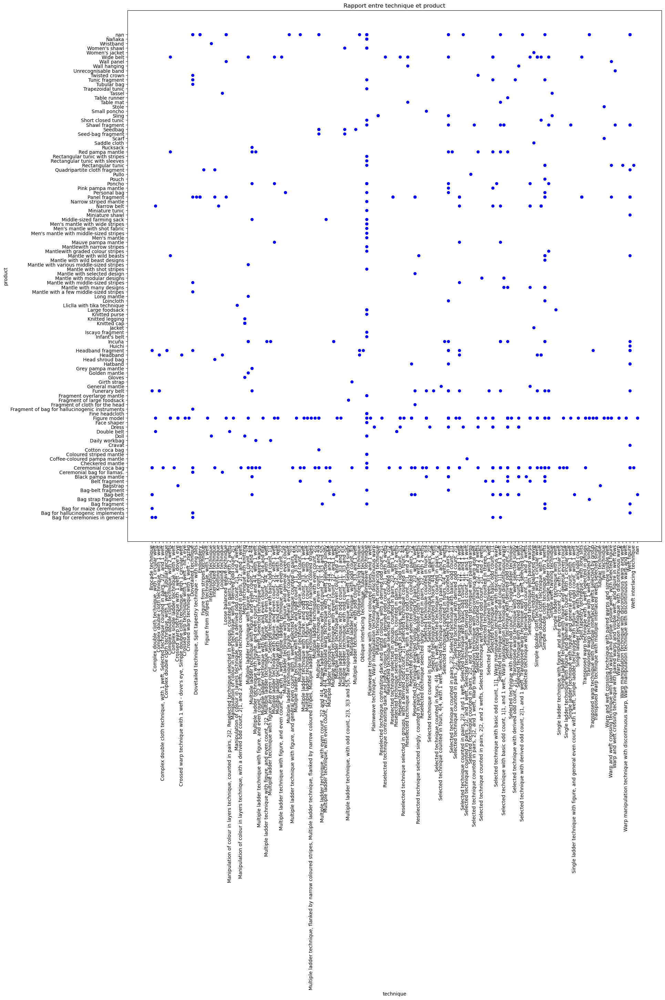

In [377]:
cat1 = 'technique'
cat2 = 'product'

plt.figure(figsize=(20, 20))

X = df_encoded[f'{cat1}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat2}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat1}')
plt.xticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'],rotation='vertical')

plt.ylabel(f'{cat2}')
plt.yticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'])

plt.title(f'Rapport entre {cat1} et {cat2}')

plt.show()

Repository/fabric

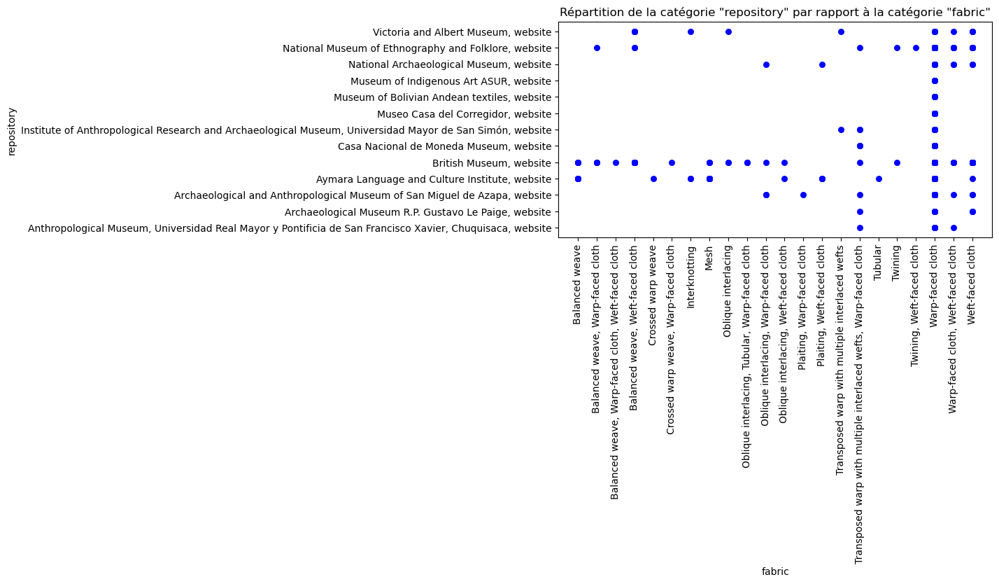

In [404]:
cat1 = 'repository'
cat2 = 'fabric'

plt.figure(figsize=(8, 4))
plt.rcParams['figure.figsize'] = 40, 12

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Répartition de la catégorie "{cat1}" par rapport à la catégorie "{cat2}"')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

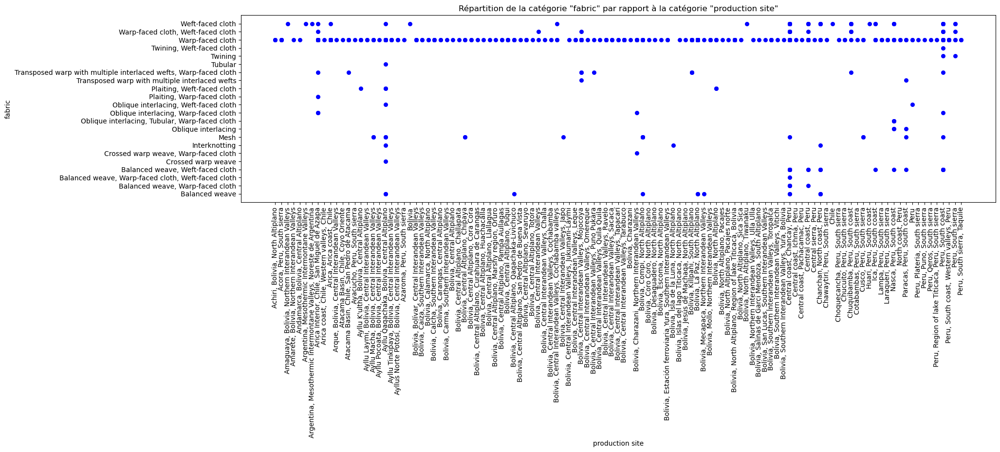

In [400]:
cat1 = 'fabric'
cat2 = 'production site'

plt.figure(figsize=(20, 5))
plt.rcParams['figure.figsize'] = 40, 12

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Répartition de la catégorie "{cat1}" par rapport à la catégorie "{cat2}"')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

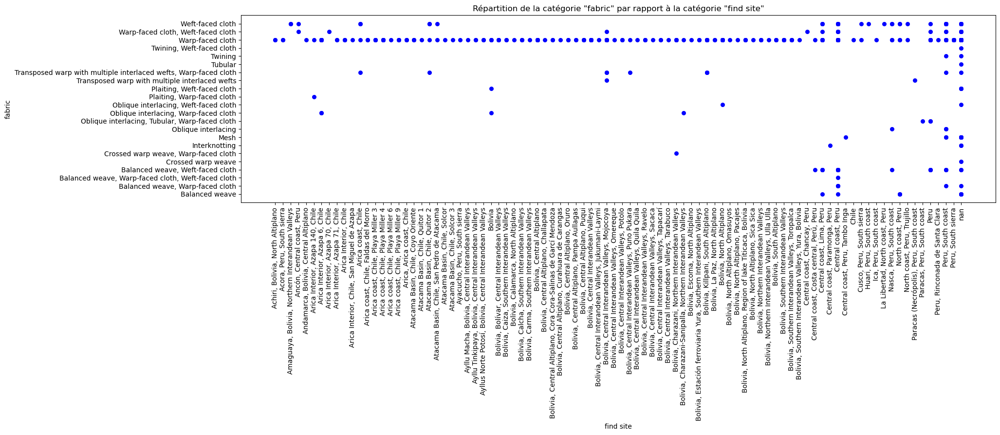

In [401]:
cat1 = 'fabric'
cat2 = 'find site'

plt.figure(figsize=(20, 5))
plt.rcParams['figure.figsize'] = 40, 12

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Répartition de la catégorie "{cat1}" par rapport à la catégorie "{cat2}"')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

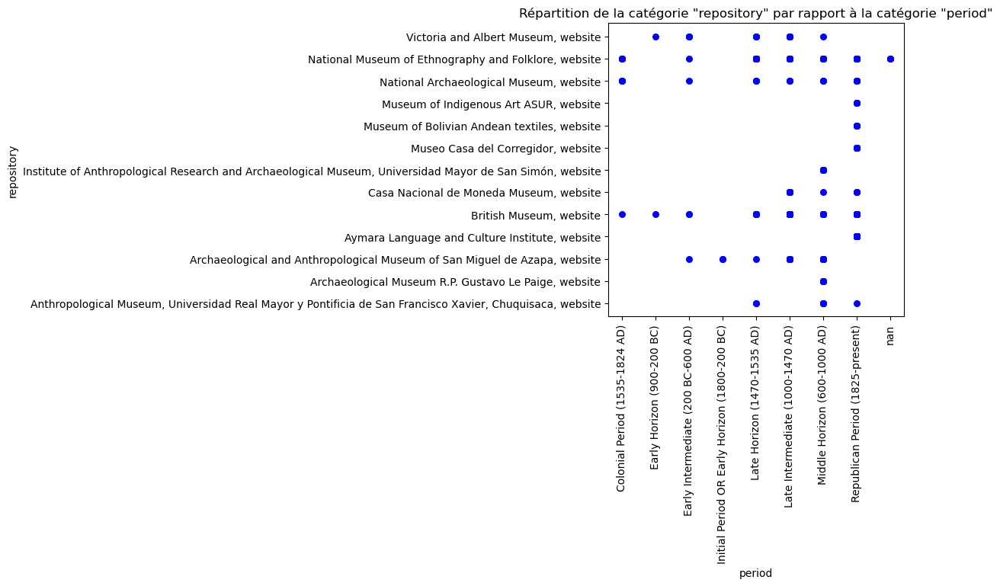

In [410]:
cat1 = 'repository'
cat2 = 'period'

plt.figure(figsize=(5,5))
plt.rcParams['figure.figsize'] = 40, 12

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Répartition de la catégorie "{cat1}" par rapport à la catégorie "{cat2}"')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()

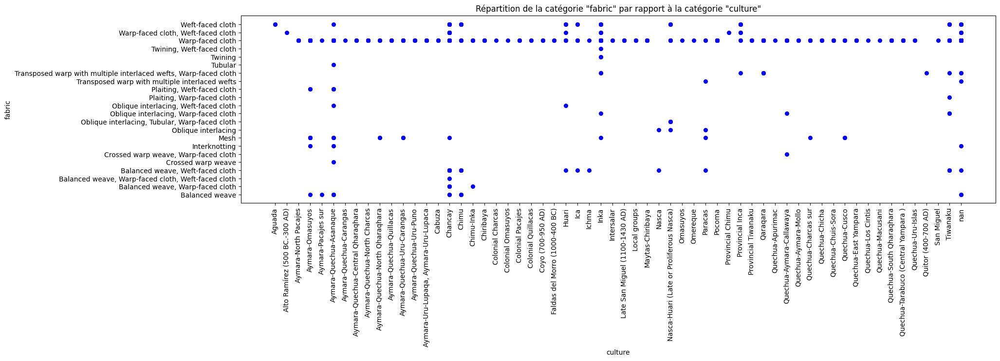

In [10]:
cat1 = 'fabric'
cat2 = 'culture'

plt.figure(figsize=(20, 5))
plt.rcParams['figure.figsize'] = 40, 12

X = df_encoded[f'{cat2}'].to_numpy().reshape(-1, 1)
Y = df_encoded[f'{cat1}'].to_list()

plt.scatter(X, Y, color="b", marker="o", s=30)

plt.xlabel(f'{cat2}')
plt.xticks(ticks=dico[f'nb_{cat2}'],
          labels=dico[f'name_{cat2}'],rotation='vertical')

plt.ylabel(f'{cat1}')
plt.yticks(ticks=dico[f'nb_{cat1}'],
          labels=dico[f'name_{cat1}'])

plt.title(f'Répartition de la catégorie "{cat1}" par rapport à la catégorie "{cat2}"')

plt.savefig(f'R_"{cat1}"_"{cat2}".png', bbox_inches='tight')

plt.show()